# Intro

OpenAI's CLIP (Contrastive Language-Image Pretraining) model is a machine learning model designed to understand and generate meaningful representations of images and text. It is trained on a large dataset of images and their associated textual descriptions, learning to associate images with their corresponding text.
The key innovation in CLIP is its use of contrastive learning, which involves training the model to recognize the correct pairing of an image and its description among a set of incorrect pairings. This approach enables the model to learn a wide range of visual concepts and their textual representations, making it capable of performing various tasks, such as image classification, object detection, and zero-shot learning.
CLIP's ability to understand both images and text allows it to be used in a variety of applications, including image search, content moderation, and generating image captions. Its versatility and performance have made it a popular choice for researchers and developers working on computer vision and natural language processing tasks.

In this notebook we are going to use a pretrained CLIP model for zero-shot object detection.

# Imports

In [1]:
!pip install git+https://github.com/openai/CLIP.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-0e5gf0qw
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-0e5gf0qw
  Resolved https://github.com/openai/CLIP.git to commit a9b1bf5920416aaeaec965c25dd9e8f98c864f16
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 7.9 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369370 sha256=ad6945695878d446c0579435361651f8b1684f4b3135a16303f0607902fab377
  Stored in directory: /tmp/pip-ephem-wheel-cache-2gy_ic9s/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip


In [2]:
import clip
import torch
import requests
import numpy as np
import torchvision
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import transforms
from torchvision.utils import draw_bounding_boxes

# Data

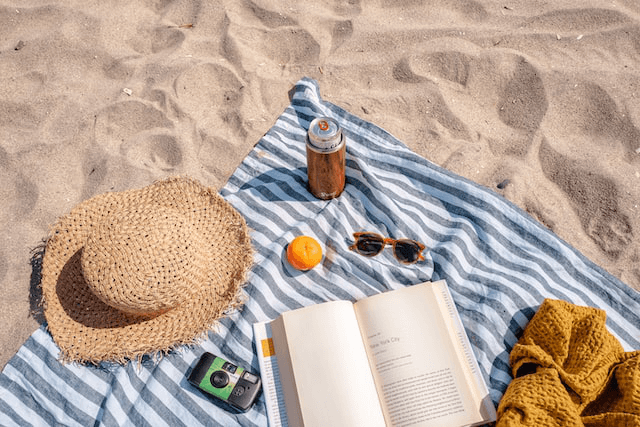

In [3]:
response = requests.get('https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/zero-sh-obj-detection_3.png')
img = Image.open(BytesIO(response.content)).convert("RGB")
img

# Extracting candidate regions

For this part use the RegionProposalNetwork in a pretrained faster rcnn to extract some candidate regions of different objects. Then visualize all the bounding boxes. You should get an image like this:

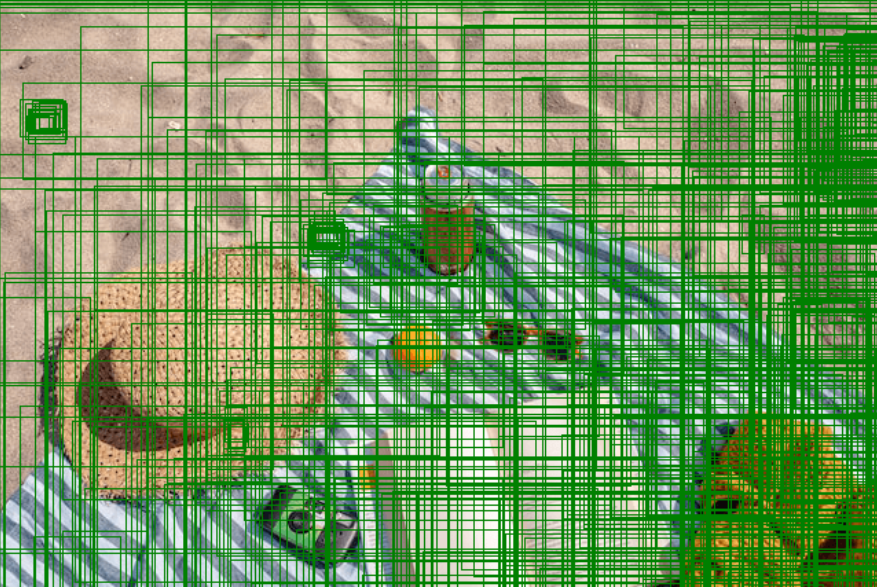

In [11]:
response = requests.get('https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/zero-sh-obj-detection_3.png')
img = Image.open(BytesIO(response.content)).convert("RGB")

faster_rcnn = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=torchvision.models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
faster_rcnn.eval()

# =========================== BEGIN ===========================

transform = transforms.ToTensor()
img_tensor = transform(img)
# pass the image through the model


transformed = faster_rcnn.transform([img_tensor])[0]
features = faster_rcnn.backbone(transformed.tensors)
boxes = faster_rcnn.rpn(transformed, features)[0][0]

second_boxes = faster_rcnn(img_tensor.unsqueeze(0))[0]['boxes'].detach()
print(boxes.shape)
# =========================== END ===========================

torch.Size([1000, 4])


In [ ]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

def plot_image_with_boxes(image, boxes, labels=None):
    fig, ax = plt.subplots(1)
    ax.imshow(transforms.ToPILImage()(image))
    for i, box in enumerate(boxes):
        x_min, y_min, x_max, y_max = box
        rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, fill=False, edgecolor='green')
        ax.add_patch(rect)
        if labels is not None:
            label_size = len(labels) * 10
            ax.text(x_min + (x_max - x_min) / 2 - label_size / 2, y_min, labels[i], fontsize=10, verticalalignment='top', color='black')

    plt.tight_layout()
    plt.axis('off')
    plt.show()

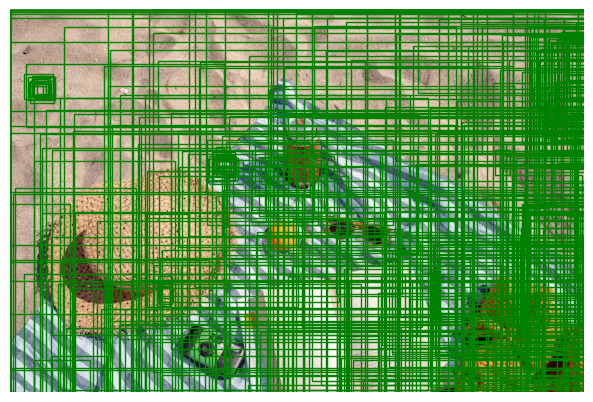

In [12]:
plot_image_with_boxes(img_tensor, boxes)

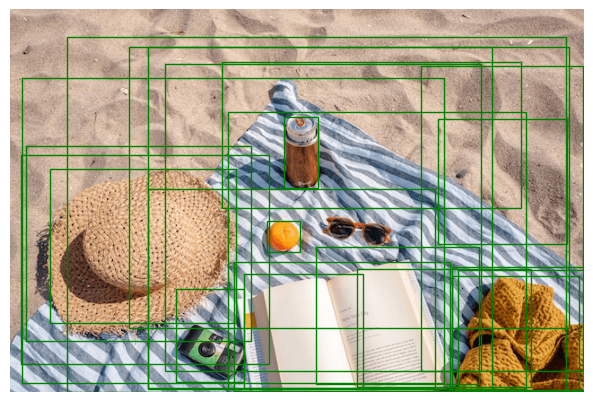

In [13]:
plot_image_with_boxes(img_tensor, second_boxes)

# Object Detection

Now extract the CLIP representation of candidate regions and query text. In order to get better results you need to use an ensemble of prompts for your query. For each query write multiple similar prompts like the given example. Average the embedding of all prompts to get a representation of your query and then compute the cosine similarity between the query and region candidates and return the most likely. Do this for all the queries specified below and save the results in the notebook.

In [6]:
ch , height, width = img_tensor.shape
print(f'height = {height}, width = {width}')

height = 427, width = 640


In [7]:
def get_coordinates_of_object_from_query(model, preprocessor, query, img_tensor, boxes, width=width, height=height):
    max_similarity = -np.inf
    max_rel_box = None
    model.eval()
    for box in boxes:
        x_min, y_min , x_max, y_max = box
        x_min, y_min , x_max, y_max = int(x_min.item()), int(y_min.item()), min(width, int(x_max.item())), min(height, int(y_max.item()))

        if x_min > x_max or x_min > width:
            continue

        if y_min > y_max or y_min > height:
            continue

        cropped_image = img_tensor[:,y_min:y_max+1,x_min:x_max+1]
        if not torch.prod(torch.tensor(cropped_image.shape)):
            continue

        cropped_image = preprocessor(transforms.functional.to_pil_image(cropped_image)).unsqueeze(0).to(device)
        tokenized_query = clip.tokenize(query).to(device)

        image_emb = model.encode_image(cropped_image)
        text_emb = model.encode_text(tokenized_query)
        image_emb = F.normalize(image_emb, p=2, dim=-1)
        text_emb = text_emb.mean(dim=0, keepdim=True)
        text_emb = F.normalize(text_emb, p=2, dim=-1)

        similarity = torch.dot(image_emb.view(-1), text_emb.view(-1))
        if similarity > max_similarity:
            max_similarity = similarity
            max_rel_box = box
    return max_rel_box.cpu().numpy()

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
clip_model, preprocessor = clip.load("ViT-B/32", device=device)

100%|███████████████████████████████████████| 338M/338M [00:11<00:00, 30.0MiB/s]


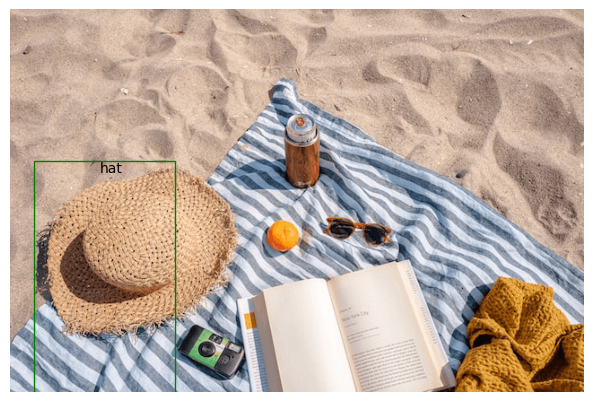

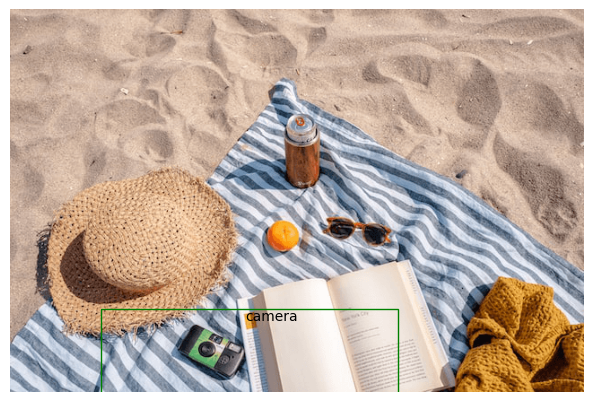

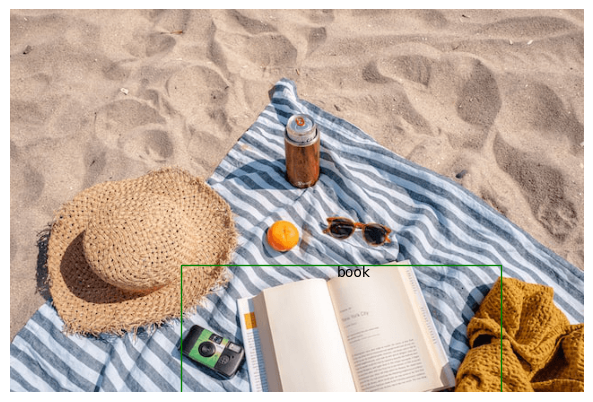

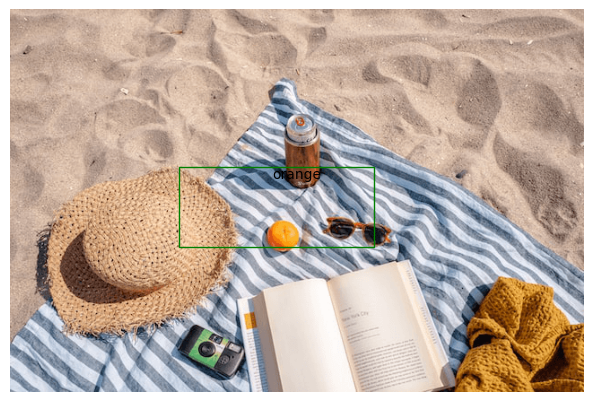

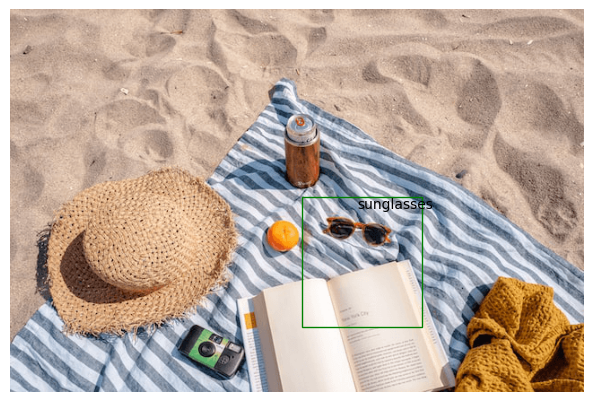

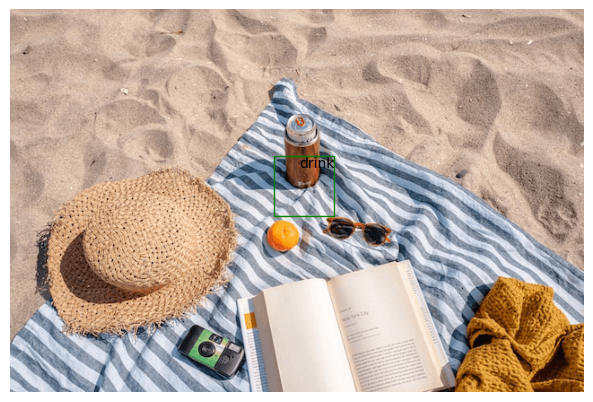

In [9]:
queries = [
    [
        'a hat',
        'a photo of a hat',
        'a picture of a brown hat',
        'a fedora hat',
        'a sun hat',
        'a top hat',
        'a cowboy hat',
        'a wide-brimmed hat',
        'a straw boater hat',
    ]
    ,
    [
        'a camera',
        'a photo of a camera',
        'handicam',
        'small camera',
        'a DSLR camera',
        'a vintage camera',
        'a point-and-shoot camera',
        'a mirrorless camera',
        'a film camera',
        'a digital camera',
        'a disposable camera',
        'a polaroid camera',
        'a spy camera',
    ]
    ,[
        'a book',
        'photo of a book',
        'a book that is open',
    ]

    ,[
        'an orange',
        'a photo of a fruit',
        'orange fruit',
        'oragne in the middle of the photo',
    ]

    ,[
        'sunglasses',
        'a photo of a pair of sunglasses',
        'a pair of a sunglasses in the middle of the photo'
        'glasses',
        'orange frame sunglasses'
    ]

    ,[
        'a drink',
        'a photo of an orange colored drink in the middle of the photo',
        'an orange colored bottle',
        'can of drink',
    ]
]

labels = ['hat', 'camera', 'book', 'orange', 'sunglasses', 'drink']
# =========================== BEGIN ===========================

all_boxes = []
for query, label in zip(queries, labels):
    pred_box = get_coordinates_of_object_from_query(clip_model, preprocessor, query, img_tensor, boxes, width, height)
    all_boxes.append(pred_box)
    plot_image_with_boxes(img_tensor, [pred_box], [label])

# =========================== END ===========================

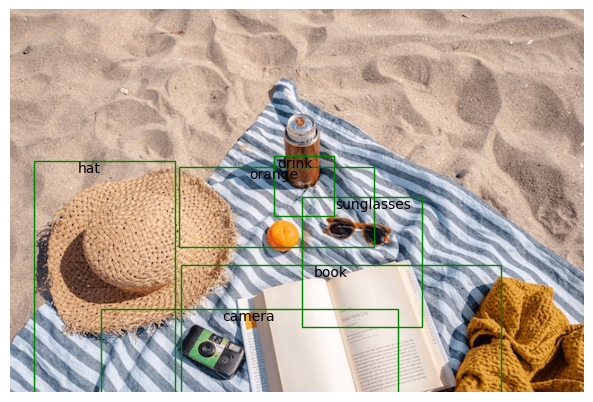

In [14]:
plot_image_with_boxes(img_tensor, all_boxes, labels)

## For The Second Proposals

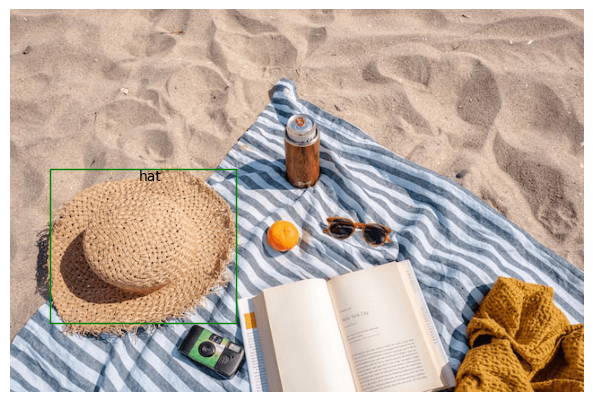

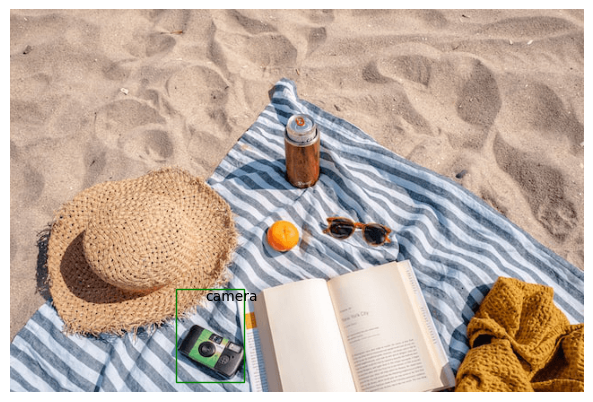

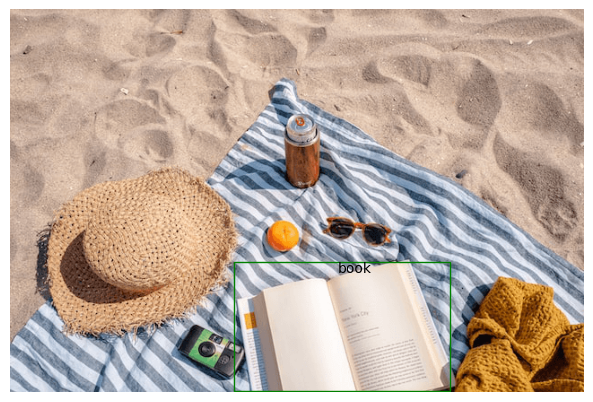

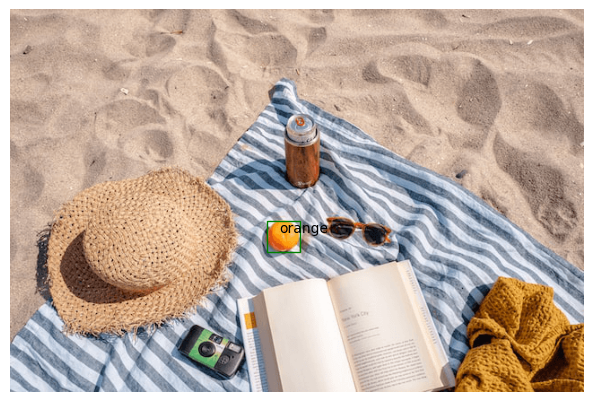

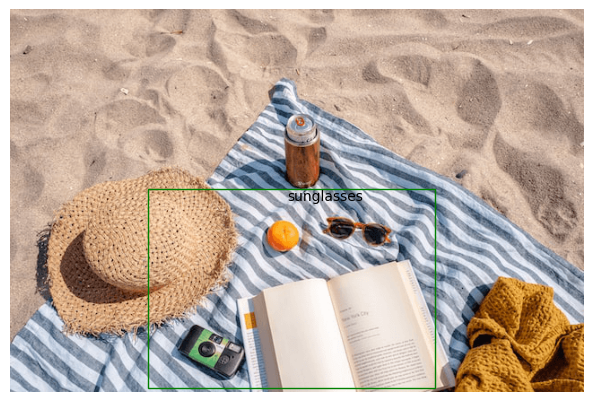

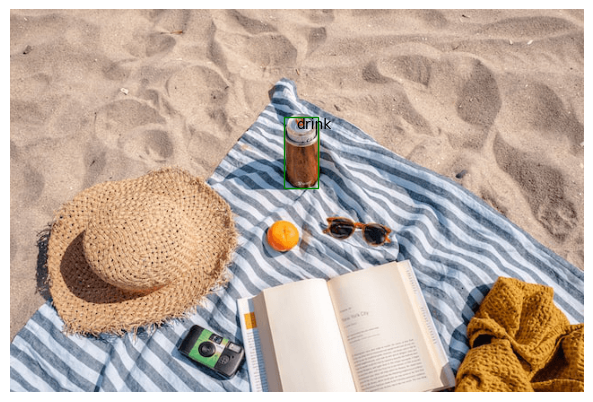

In [15]:
all_boxes = []
for query, label in zip(queries, labels):
    pred_box = get_coordinates_of_object_from_query(clip_model, preprocessor, query, img_tensor, second_boxes, width, height)
    all_boxes.append(pred_box)
    plot_image_with_boxes(img_tensor, [pred_box], [label])

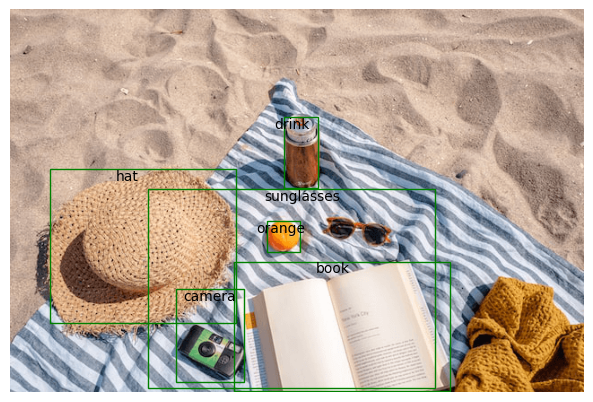

In [16]:
plot_image_with_boxes(img_tensor, all_boxes, labels)